In [0]:
import torch
from torch import nn, optim
from torch.autograd.variable import Variable
from torchvision import transforms, datasets
import apex as amp
!pip install -q tensorboardX

In [0]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive/My\ Drive

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /gdrive
/gdrive/My Drive


In [0]:
import pandas as pd
import numpy as np
from utils import Logger

# Load Data
train=pd.read_csv('kmnist_train.csv')
train_images=train.drop('label',axis=1)

In [0]:
compose = transforms.Compose(
    [transforms.ToPILImage(),
        transforms.Resize(64),
        transforms.ToTensor(),
        transforms.Normalize((0.5,), (0.5,))
])
IMGSIZE = 28

In [0]:
class KannadaDataSet(torch.utils.data.Dataset):
    def __init__(self, images,transforms = None):
        self.X = images
        self.transforms = transforms
         
    def __len__(self):
        return (len(self.X))
    
    def __getitem__(self, i):
        data = self.X.iloc[i,:]
        data = np.array(data).astype(np.uint8).reshape(IMGSIZE,IMGSIZE,1)
        
        if self.transforms:
            data = self.transforms(data)
                
        return data

batch_size = 100
train_data = KannadaDataSet(train_images, compose)
data_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size)

In [0]:
# Num batches
num_batches = len(data_loader)

In [0]:
class DiscriminativeNet(torch.nn.Module):

    def __init__(self):
        super(DiscriminativeNet, self).__init__()
        
        self.conv1 = nn.Sequential(
            nn.Conv2d(
                in_channels=1, out_channels=128, kernel_size=4, 
                stride=2, padding=1, bias=False
            ),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(
                in_channels=128, out_channels=256, kernel_size=4,
                stride=2, padding=1, bias=False
            ),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.conv3 = nn.Sequential(

            nn.Conv2d(
                in_channels=256, out_channels=512, kernel_size=4,
                stride=2, padding=1, bias=False
            ),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.conv4 = nn.Sequential(
            nn.Conv2d(
                in_channels=512, out_channels=1024, kernel_size=4,
                stride=2, padding=1, bias=False
            ),
            nn.BatchNorm2d(1024),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.out = nn.Sequential(
            nn.Linear(1024*4*4, 1),
            nn.Sigmoid(),
        )

    def forward(self, x):
        # Convolutional layers
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        # Flatten and apply sigmoid
        x = x.view(-1, 1024*4*4)
        x = self.out(x)
        return x

In [0]:
def images_to_vectors(images):
    return images.view(images.size(0), 784)

def vectors_to_images(vectors):
    return vectors.view(vectors.size(0), 1, 28, 28)

In [0]:
class GenerativeNet(torch.nn.Module):
    
    def __init__(self):
        super(GenerativeNet, self).__init__()
        
        self.linear = torch.nn.Linear(100, 1024*4*4)
        
        self.conv1 = nn.Sequential(
            nn.ConvTranspose2d(
                in_channels=1024, out_channels=512, kernel_size=4,
                stride=2, padding=1, bias=False
            ),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True)
        )
        self.conv2 = nn.Sequential(
            nn.ConvTranspose2d(
                in_channels=512, out_channels=256, kernel_size=4,
                stride=2, padding=1, bias=False
            ),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )
        self.conv3 = nn.Sequential(
            nn.ConvTranspose2d(
                in_channels=256, out_channels=128, kernel_size=4,
                stride=2, padding=1, bias=False
            ),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True)
        )
        self.conv4 = nn.Sequential(
            nn.ConvTranspose2d(
                in_channels=128, out_channels=1, kernel_size=4,
                stride=2, padding=1, bias=False
            )
        )
        self.out = torch.nn.Tanh()

    def forward(self, x):
        # Project and reshape
        x = self.linear(x)
        x = x.view(x.shape[0], 1024, 4, 4)
        # Convolutional layers
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        # Apply Tanh
        return self.out(x)

# Noise
def noise(size):
    n = Variable(torch.randn(size, 100))
    if torch.cuda.is_available(): return n.cuda()
    return n

In [0]:
def init_weights(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1 or classname.find('BatchNorm') != -1:
        m.weight.data.normal_(0.00, 0.02)

In [0]:
# Create Network instances and init weights
generator = GenerativeNet()
generator.apply(init_weights)

discriminator = DiscriminativeNet()
discriminator.apply(init_weights)

# Enable cuda if available
if torch.cuda.is_available():
    generator.cuda()
    discriminator.cuda()

In [0]:
# Optimizers
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
g_optimizer = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Loss function
loss = nn.BCELoss()

# Number of epochs
num_epochs = 200

In [0]:
def real_data_target(size):
    '''
    Tensor containing ones, with shape = size
    '''
    data = Variable(torch.ones(size, 1))
    if torch.cuda.is_available(): return data.cuda()
    return data

def fake_data_target(size):
    '''
    Tensor containing zeros, with shape = size
    '''
    data = Variable(torch.zeros(size, 1))
    if torch.cuda.is_available(): return data.cuda()
    return data

In [0]:
def train_discriminator(optimizer, real_data, fake_data):
    # Reset gradients
    optimizer.zero_grad()
    
    # 1. Train on Real Data
    prediction_real = discriminator(real_data)
    # Calculate error and backpropagate
    error_real = loss(prediction_real, real_data_target(real_data.size(0)))
    error_real.backward()

    # 2. Train on Fake Data
    prediction_fake = discriminator(fake_data)
    # Calculate error and backpropagate
    error_fake = loss(prediction_fake, fake_data_target(real_data.size(0)))
    error_fake.backward()
    
    # Update weights with gradients
    optimizer.step()
    
    return error_real + error_fake, prediction_real, prediction_fake
    return (0, 0, 0)

In [0]:

def train_generator(optimizer, fake_data):
    # Reset gradients
    optimizer.zero_grad()
    # Sample noise and generate fake data
    prediction = discriminator(fake_data)
    # Calculate error and backpropagate
    error = loss(prediction, real_data_target(prediction.size(0)))
    error.backward()
    # Update weights with gradients
    optimizer.step()
    # Return error
    return error

In [0]:
num_test_samples = 16
test_noise = noise(num_test_samples)

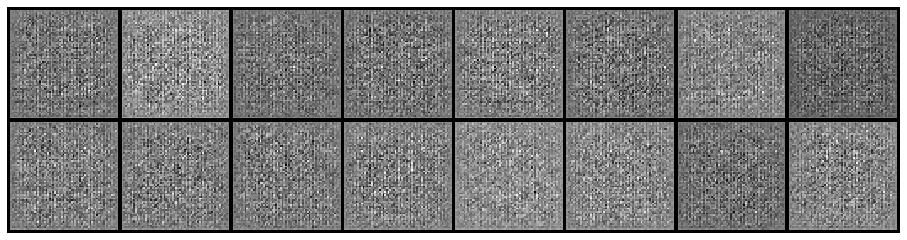

Epoch: [0/200], Batch Num: [0/600]
Discriminator Loss: 1.3853, Generator Loss: 0.7039
D(x): 0.5012, D(G(z)): 0.5007


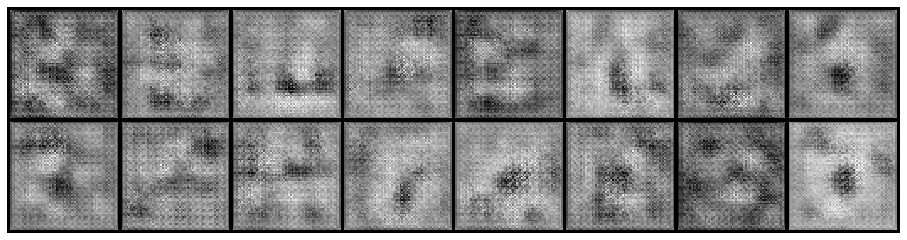

Epoch: [0/200], Batch Num: [100/600]
Discriminator Loss: 0.0183, Generator Loss: 4.7146
D(x): 0.9912, D(G(z)): 0.0095


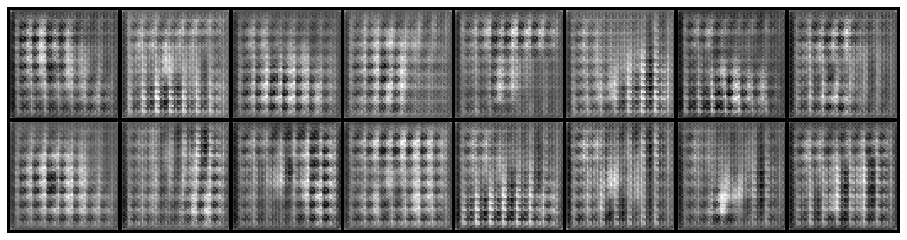

Epoch: [0/200], Batch Num: [200/600]
Discriminator Loss: 0.0322, Generator Loss: 4.6197
D(x): 0.9826, D(G(z)): 0.0144


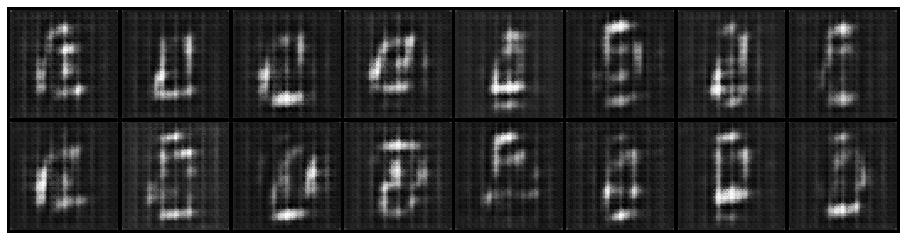

Epoch: [0/200], Batch Num: [300/600]
Discriminator Loss: 0.5611, Generator Loss: 2.7001
D(x): 0.6431, D(G(z)): 0.0778


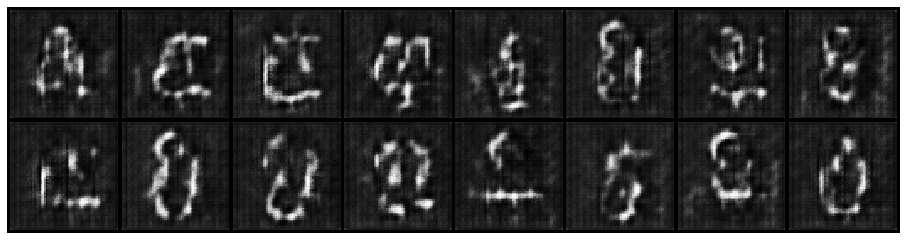

Epoch: [0/200], Batch Num: [400/600]
Discriminator Loss: 0.2210, Generator Loss: 3.4893
D(x): 0.9335, D(G(z)): 0.1309


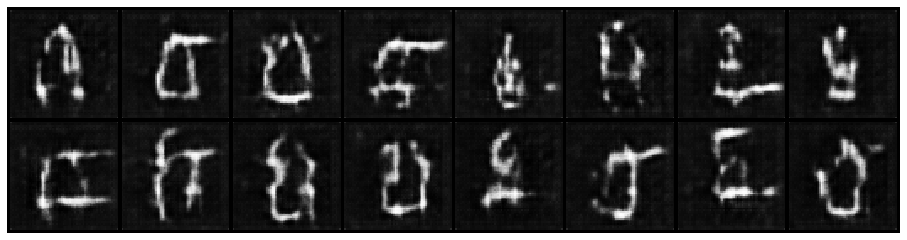

Epoch: [0/200], Batch Num: [500/600]
Discriminator Loss: 0.3436, Generator Loss: 2.3624
D(x): 0.7915, D(G(z)): 0.0934


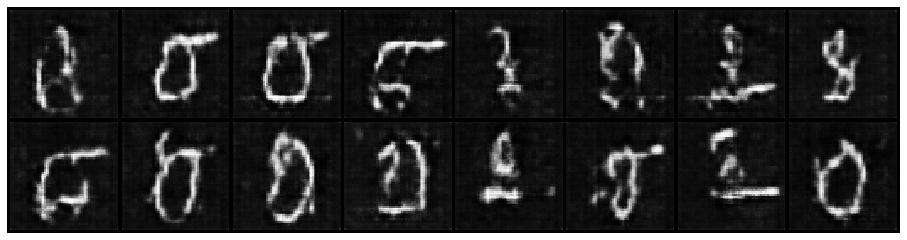

Epoch: [1/200], Batch Num: [0/600]
Discriminator Loss: 1.0338, Generator Loss: 0.6680
D(x): 0.4203, D(G(z)): 0.0532


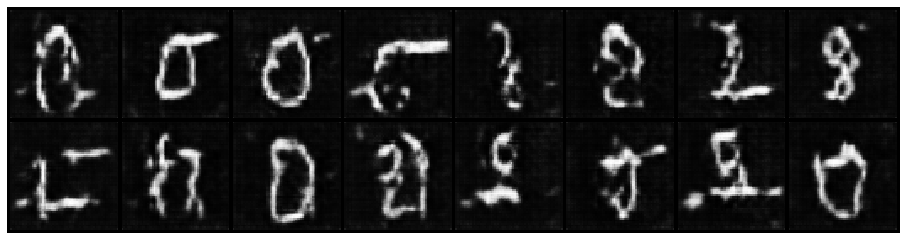

Epoch: [1/200], Batch Num: [100/600]
Discriminator Loss: 0.1999, Generator Loss: 3.6207
D(x): 0.9172, D(G(z)): 0.0991


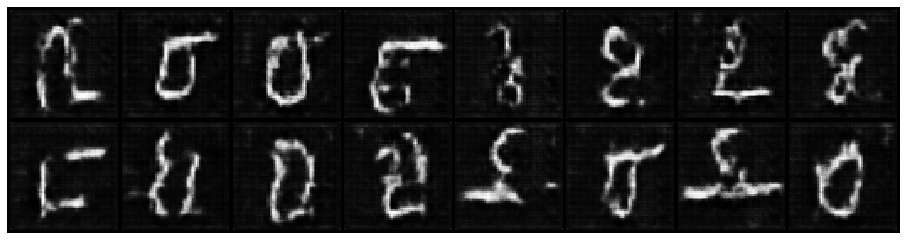

Epoch: [1/200], Batch Num: [200/600]
Discriminator Loss: 0.3805, Generator Loss: 3.3953
D(x): 0.8512, D(G(z)): 0.1767


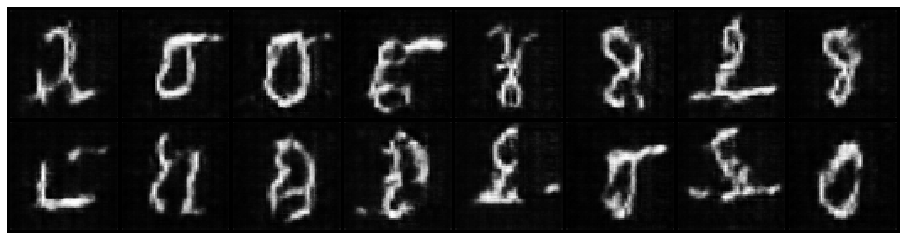

Epoch: [1/200], Batch Num: [300/600]
Discriminator Loss: 0.5846, Generator Loss: 2.0305
D(x): 0.8910, D(G(z)): 0.3530


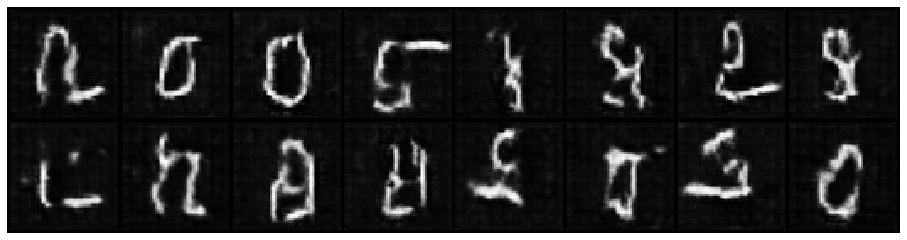

Epoch: [1/200], Batch Num: [400/600]
Discriminator Loss: 1.7041, Generator Loss: 4.4658
D(x): 0.9923, D(G(z)): 0.7565


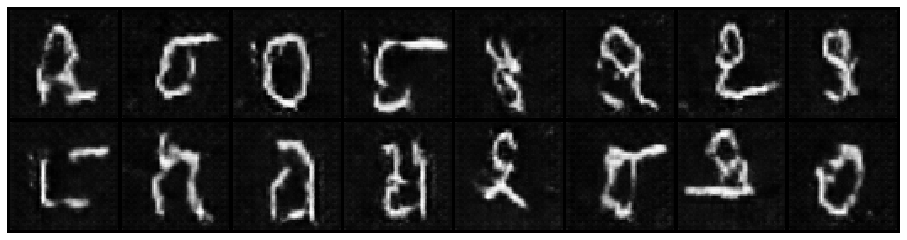

Epoch: [1/200], Batch Num: [500/600]
Discriminator Loss: 3.2084, Generator Loss: 6.7428
D(x): 0.9983, D(G(z)): 0.9401


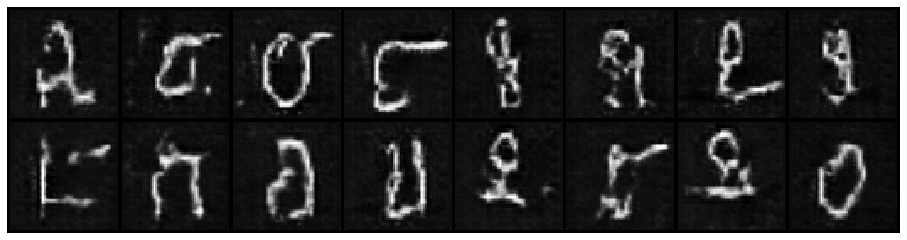

Epoch: [2/200], Batch Num: [0/600]
Discriminator Loss: 0.5163, Generator Loss: 1.7550
D(x): 0.7315, D(G(z)): 0.1379


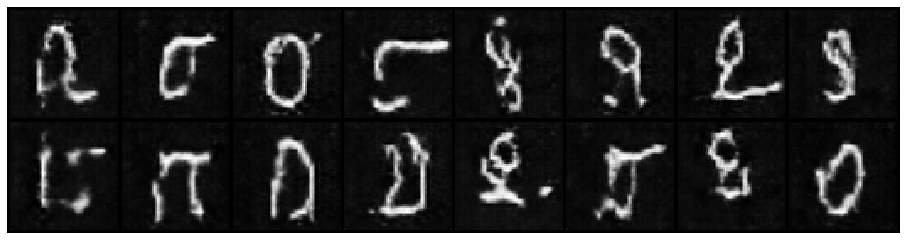

Epoch: [2/200], Batch Num: [100/600]
Discriminator Loss: 0.1092, Generator Loss: 3.8955
D(x): 0.9726, D(G(z)): 0.0735


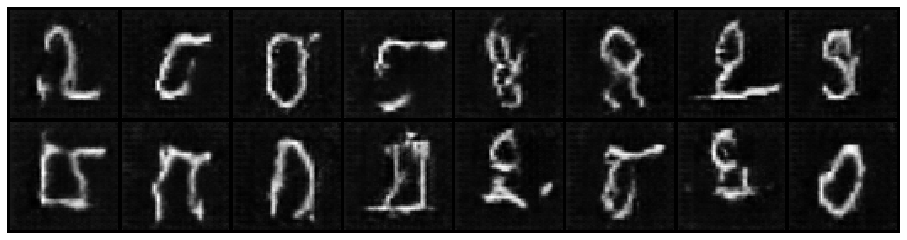

Epoch: [2/200], Batch Num: [200/600]
Discriminator Loss: 0.2602, Generator Loss: 3.1132
D(x): 0.8369, D(G(z)): 0.0633


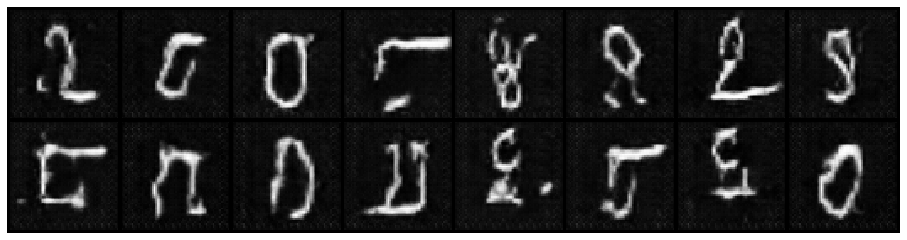

Epoch: [2/200], Batch Num: [300/600]
Discriminator Loss: 0.2331, Generator Loss: 2.1700
D(x): 0.8283, D(G(z)): 0.0285


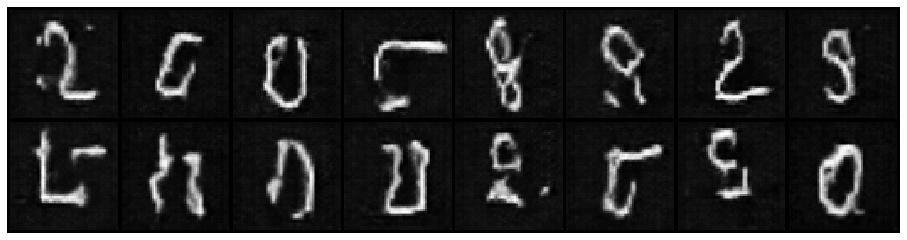

Epoch: [2/200], Batch Num: [400/600]
Discriminator Loss: 0.2479, Generator Loss: 2.2820
D(x): 0.9369, D(G(z)): 0.1535


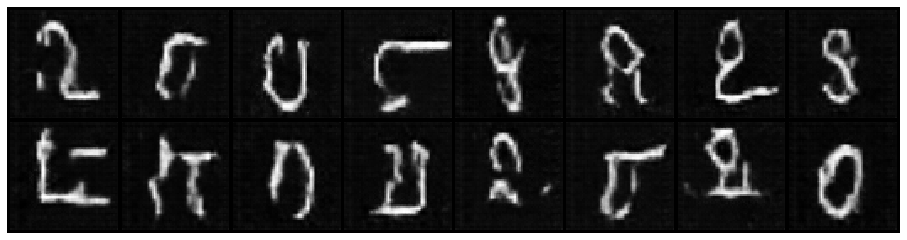

Epoch: [2/200], Batch Num: [500/600]
Discriminator Loss: 0.6939, Generator Loss: 6.3929
D(x): 0.9881, D(G(z)): 0.4471


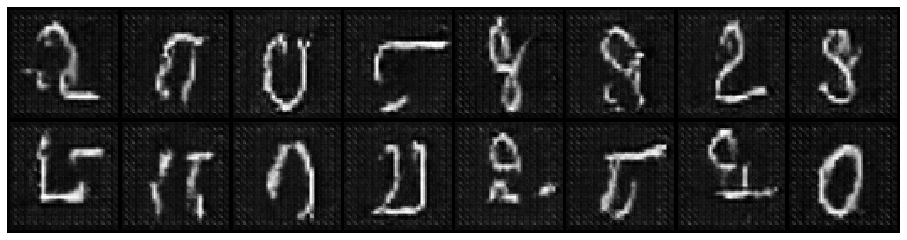

Epoch: [3/200], Batch Num: [0/600]
Discriminator Loss: 1.4324, Generator Loss: 0.2652
D(x): 0.3596, D(G(z)): 0.1419


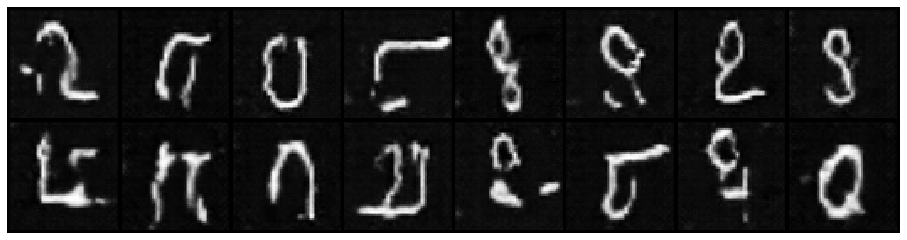

Epoch: [3/200], Batch Num: [100/600]
Discriminator Loss: 0.0665, Generator Loss: 3.9023
D(x): 0.9763, D(G(z)): 0.0401


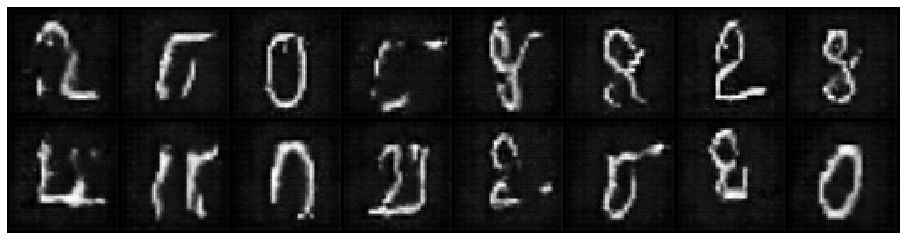

Epoch: [3/200], Batch Num: [200/600]
Discriminator Loss: 0.4158, Generator Loss: 1.9203
D(x): 0.7689, D(G(z)): 0.0933


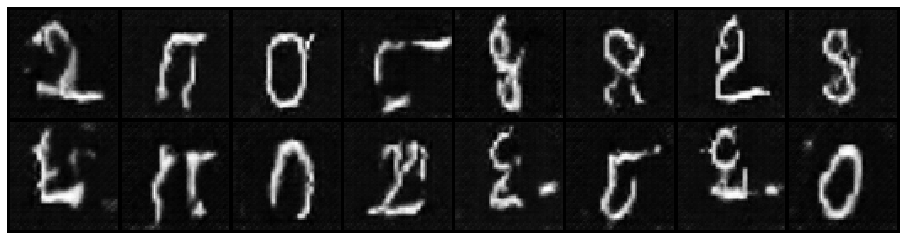

Epoch: [3/200], Batch Num: [300/600]
Discriminator Loss: 0.1361, Generator Loss: 4.2216
D(x): 0.9149, D(G(z)): 0.0395


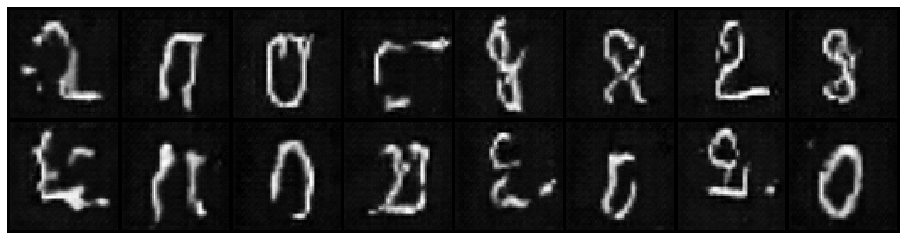

Epoch: [3/200], Batch Num: [400/600]
Discriminator Loss: 0.8440, Generator Loss: 3.5009
D(x): 0.9817, D(G(z)): 0.4901


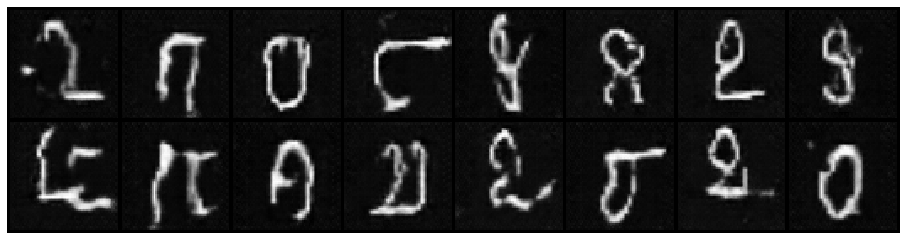

Epoch: [3/200], Batch Num: [500/600]
Discriminator Loss: 0.0843, Generator Loss: 4.0987
D(x): 0.9694, D(G(z)): 0.0496


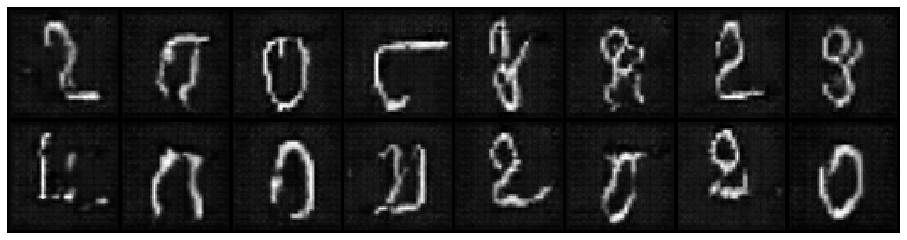

Epoch: [4/200], Batch Num: [0/600]
Discriminator Loss: 1.9185, Generator Loss: 0.4628
D(x): 0.3080, D(G(z)): 0.1874


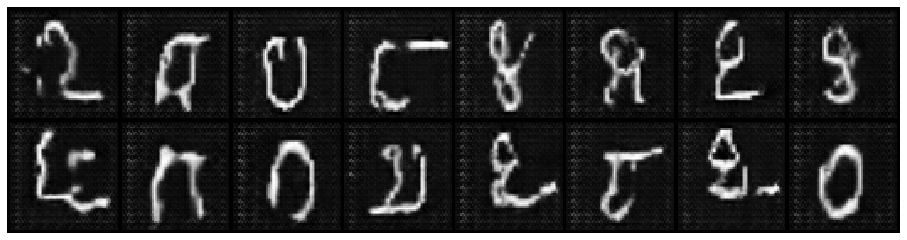

Epoch: [4/200], Batch Num: [100/600]
Discriminator Loss: 0.0551, Generator Loss: 4.5814
D(x): 0.9748, D(G(z)): 0.0279


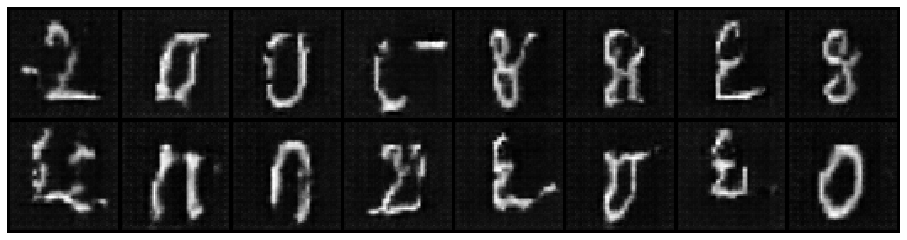

Epoch: [4/200], Batch Num: [200/600]
Discriminator Loss: 1.0917, Generator Loss: 5.7884
D(x): 0.8915, D(G(z)): 0.5413


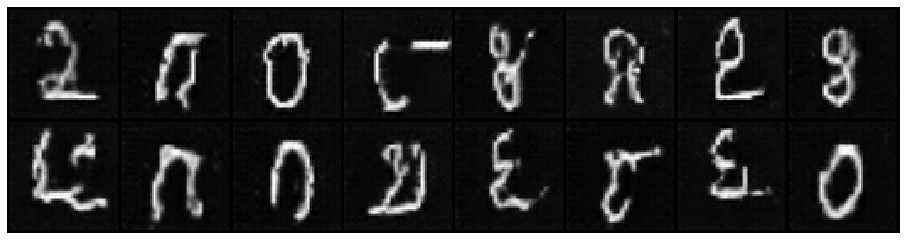

Epoch: [4/200], Batch Num: [300/600]
Discriminator Loss: 0.1072, Generator Loss: 4.2350
D(x): 0.9558, D(G(z)): 0.0543


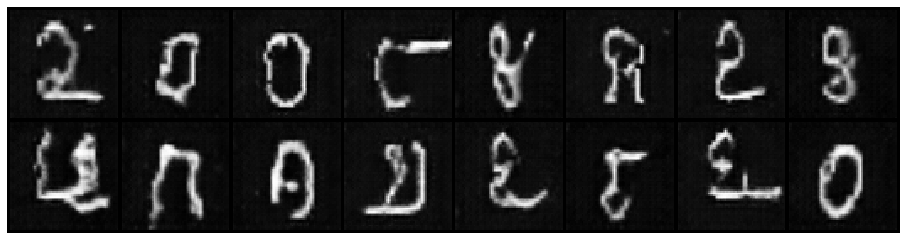

Epoch: [4/200], Batch Num: [400/600]
Discriminator Loss: 0.6017, Generator Loss: 2.3188
D(x): 0.6665, D(G(z)): 0.1188


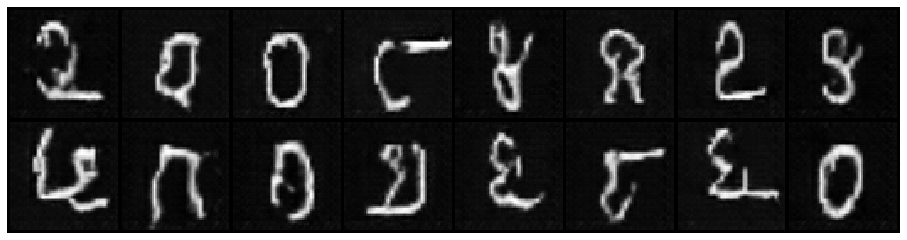

Epoch: [4/200], Batch Num: [500/600]
Discriminator Loss: 0.1039, Generator Loss: 4.9069
D(x): 0.9668, D(G(z)): 0.0646


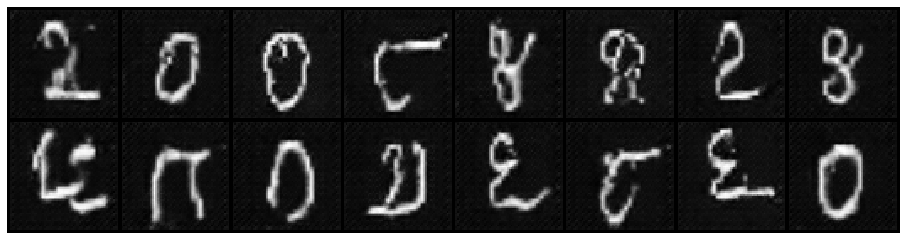

Epoch: [5/200], Batch Num: [0/600]
Discriminator Loss: 0.0637, Generator Loss: 3.2396
D(x): 0.9538, D(G(z)): 0.0141


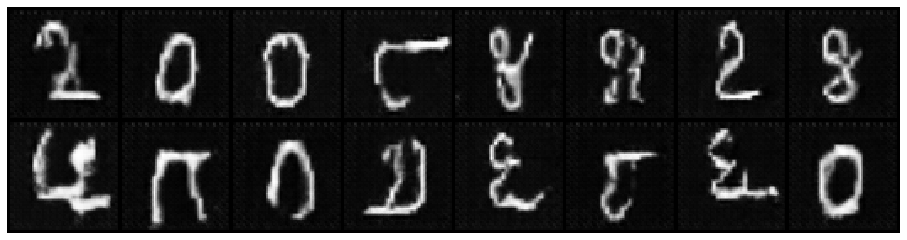

Epoch: [5/200], Batch Num: [100/600]
Discriminator Loss: 0.0626, Generator Loss: 3.5297
D(x): 0.9674, D(G(z)): 0.0275


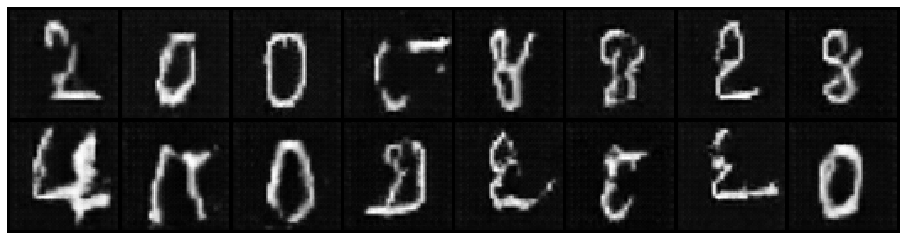

Epoch: [5/200], Batch Num: [200/600]
Discriminator Loss: 0.4420, Generator Loss: 3.4428
D(x): 0.6986, D(G(z)): 0.0325


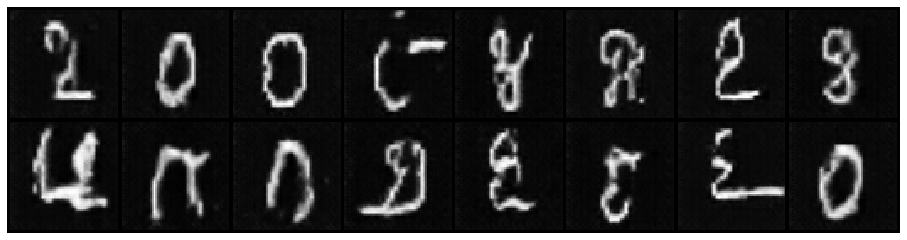

Epoch: [5/200], Batch Num: [300/600]
Discriminator Loss: 0.0521, Generator Loss: 4.4529
D(x): 0.9724, D(G(z)): 0.0228


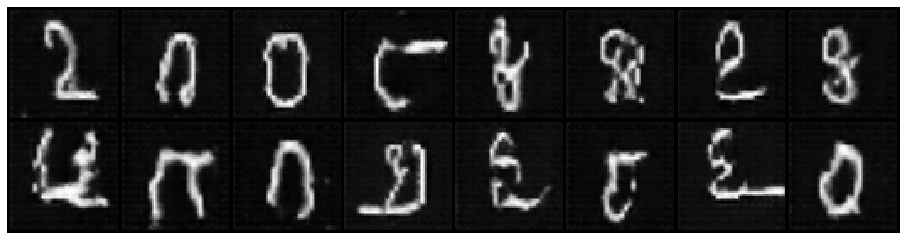

Epoch: [5/200], Batch Num: [400/600]
Discriminator Loss: 0.3973, Generator Loss: 1.4819
D(x): 0.8816, D(G(z)): 0.1955


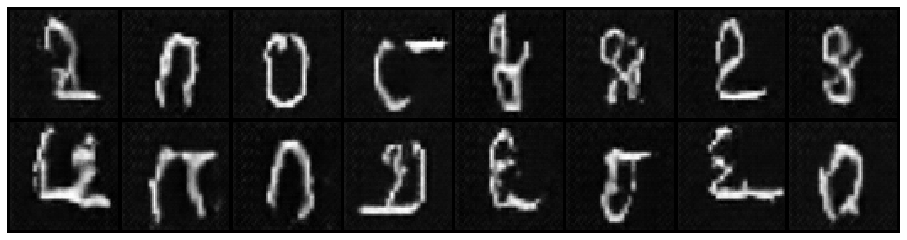

Epoch: [5/200], Batch Num: [500/600]
Discriminator Loss: 0.3197, Generator Loss: 6.1304
D(x): 0.9901, D(G(z)): 0.2423


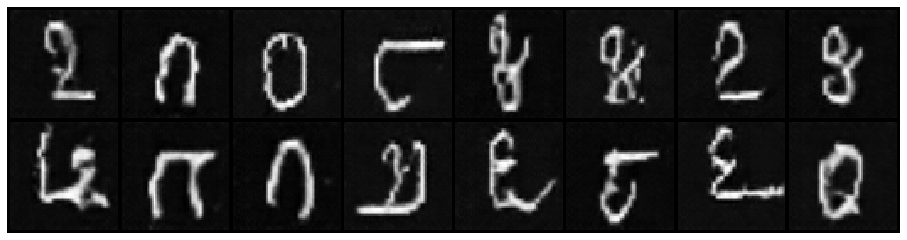

Epoch: [6/200], Batch Num: [0/600]
Discriminator Loss: 0.0467, Generator Loss: 5.1194
D(x): 0.9816, D(G(z)): 0.0269


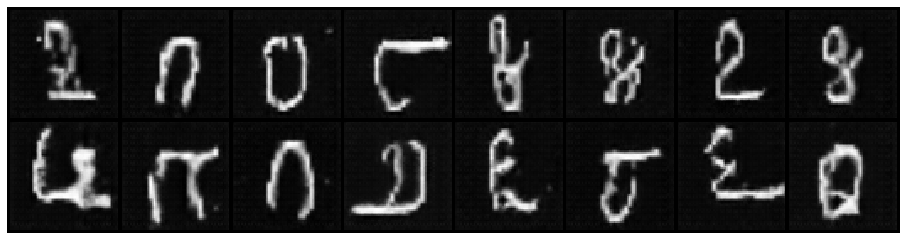

Epoch: [6/200], Batch Num: [100/600]
Discriminator Loss: 0.0779, Generator Loss: 4.6880
D(x): 0.9735, D(G(z)): 0.0463


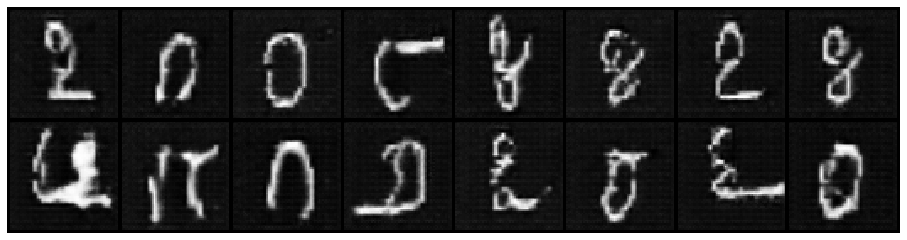

Epoch: [6/200], Batch Num: [200/600]
Discriminator Loss: 0.7379, Generator Loss: 3.2785
D(x): 0.9350, D(G(z)): 0.3995


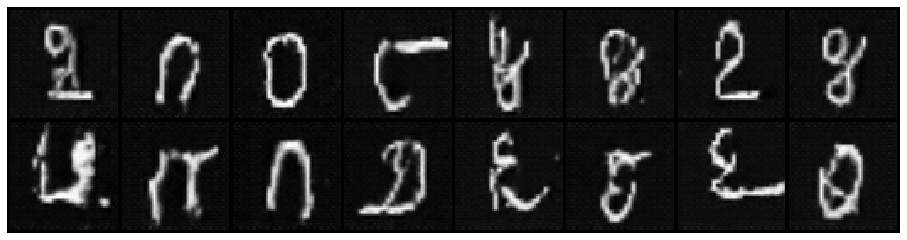

Epoch: [6/200], Batch Num: [300/600]
Discriminator Loss: 0.0639, Generator Loss: 5.4182
D(x): 0.9871, D(G(z)): 0.0482


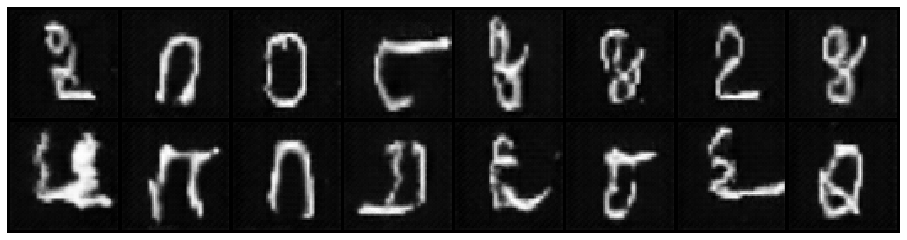

Epoch: [6/200], Batch Num: [400/600]
Discriminator Loss: 0.1911, Generator Loss: 2.7135
D(x): 0.9212, D(G(z)): 0.0870


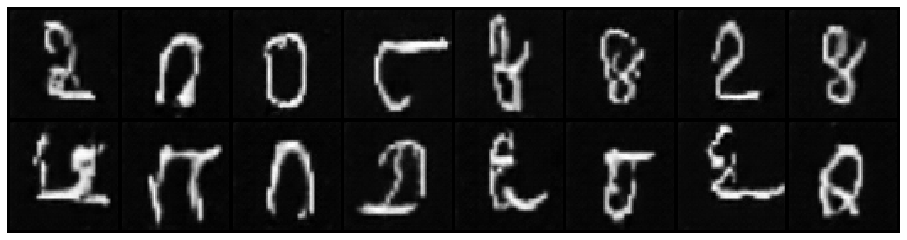

Epoch: [6/200], Batch Num: [500/600]
Discriminator Loss: 0.1042, Generator Loss: 5.8673
D(x): 0.9950, D(G(z)): 0.0881


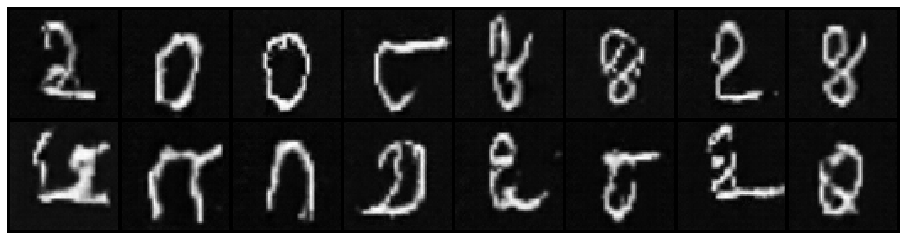

Epoch: [7/200], Batch Num: [0/600]
Discriminator Loss: 0.0292, Generator Loss: 5.3614
D(x): 0.9852, D(G(z)): 0.0138


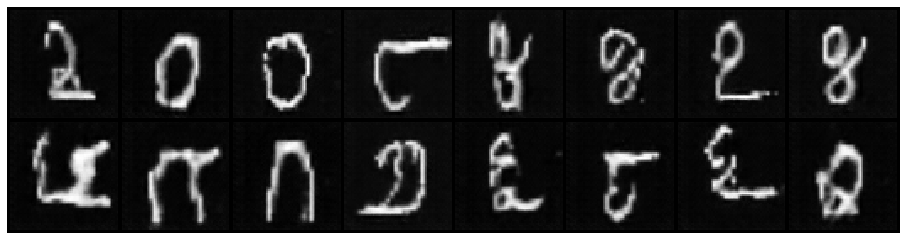

Epoch: [7/200], Batch Num: [100/600]
Discriminator Loss: 0.0355, Generator Loss: 4.7151
D(x): 0.9773, D(G(z)): 0.0121


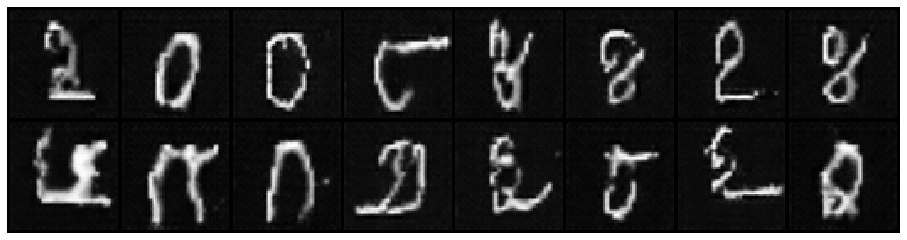

Epoch: [7/200], Batch Num: [200/600]
Discriminator Loss: 0.4317, Generator Loss: 5.3673
D(x): 0.9933, D(G(z)): 0.2941


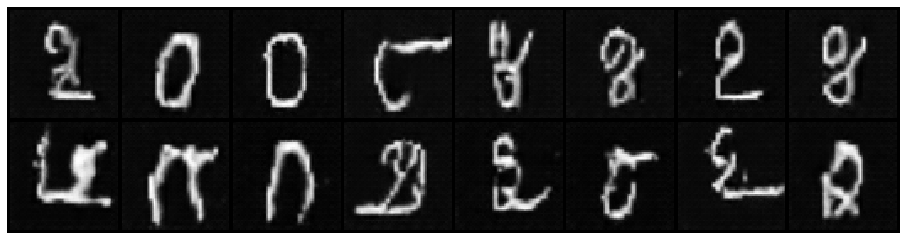

Epoch: [7/200], Batch Num: [300/600]
Discriminator Loss: 0.0427, Generator Loss: 4.4414
D(x): 0.9773, D(G(z)): 0.0189


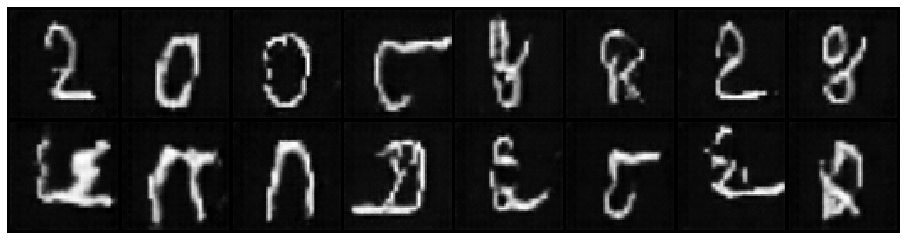

Epoch: [7/200], Batch Num: [400/600]
Discriminator Loss: 0.2888, Generator Loss: 1.2571
D(x): 0.9422, D(G(z)): 0.1769


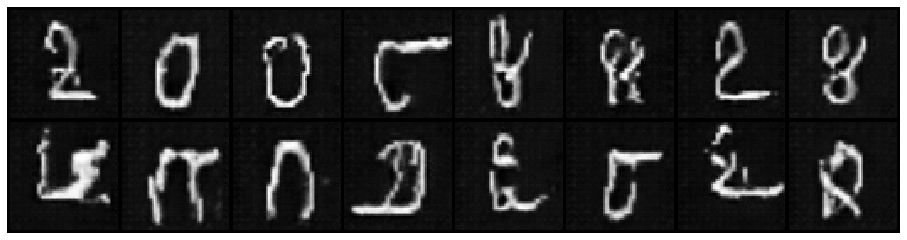

Epoch: [7/200], Batch Num: [500/600]
Discriminator Loss: 1.7138, Generator Loss: 4.8765
D(x): 0.9854, D(G(z)): 0.7345


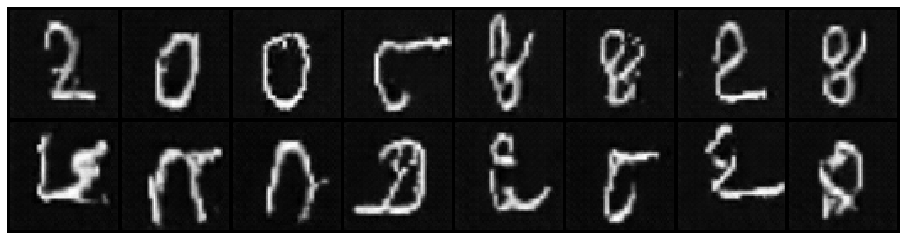

Epoch: [8/200], Batch Num: [0/600]
Discriminator Loss: 0.0999, Generator Loss: 3.8586
D(x): 0.9332, D(G(z)): 0.0259


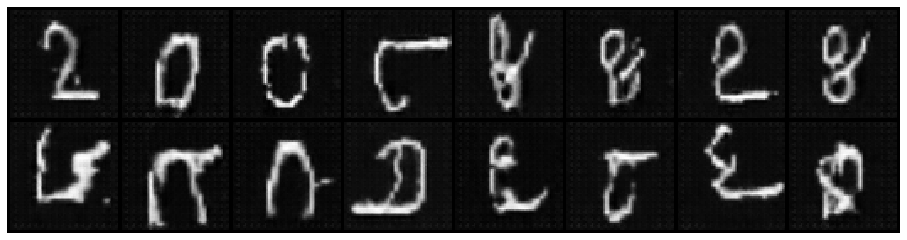

Epoch: [8/200], Batch Num: [100/600]
Discriminator Loss: 0.1319, Generator Loss: 4.4490
D(x): 0.9586, D(G(z)): 0.0765


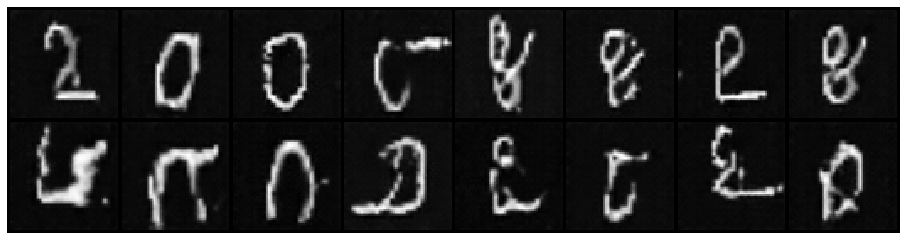

Epoch: [8/200], Batch Num: [200/600]
Discriminator Loss: 0.0245, Generator Loss: 5.5111
D(x): 0.9866, D(G(z)): 0.0105


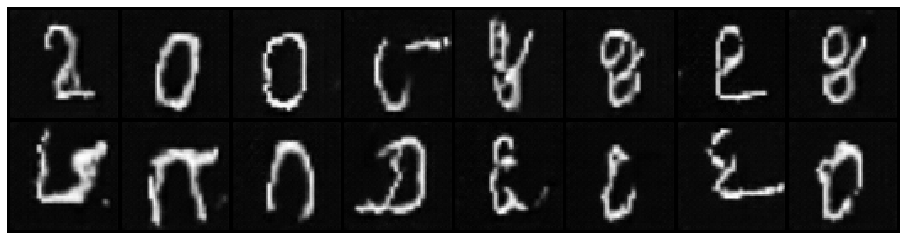

Epoch: [8/200], Batch Num: [300/600]
Discriminator Loss: 0.0182, Generator Loss: 5.6546
D(x): 0.9940, D(G(z)): 0.0119


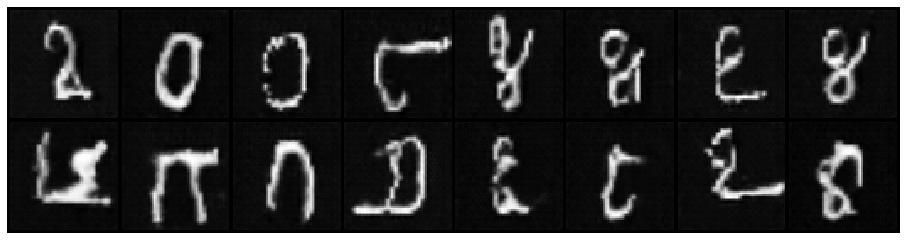

Epoch: [8/200], Batch Num: [400/600]
Discriminator Loss: 0.3580, Generator Loss: 3.4784
D(x): 0.7621, D(G(z)): 0.0458


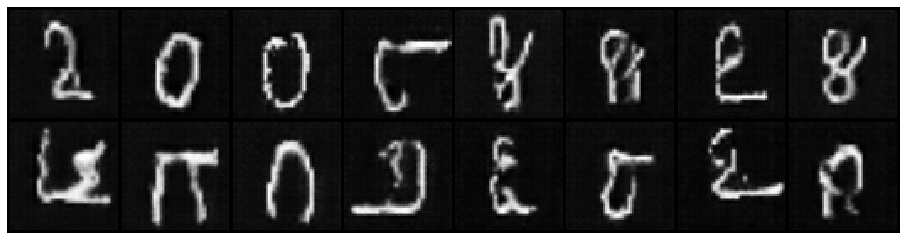

Epoch: [8/200], Batch Num: [500/600]
Discriminator Loss: 2.0463, Generator Loss: 3.8935
D(x): 0.9927, D(G(z)): 0.7697


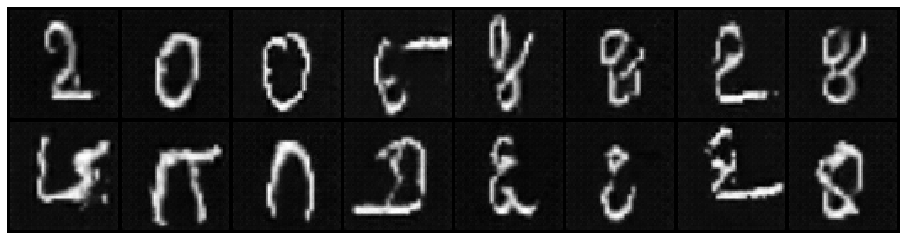

Epoch: [9/200], Batch Num: [0/600]
Discriminator Loss: 0.0786, Generator Loss: 4.0285
D(x): 0.9502, D(G(z)): 0.0238


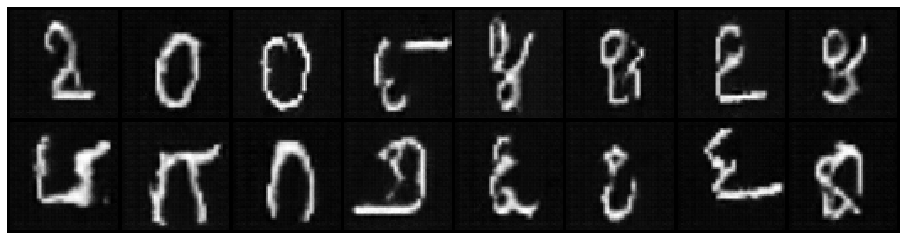

Epoch: [9/200], Batch Num: [100/600]
Discriminator Loss: 0.1194, Generator Loss: 5.2272
D(x): 0.9031, D(G(z)): 0.0084


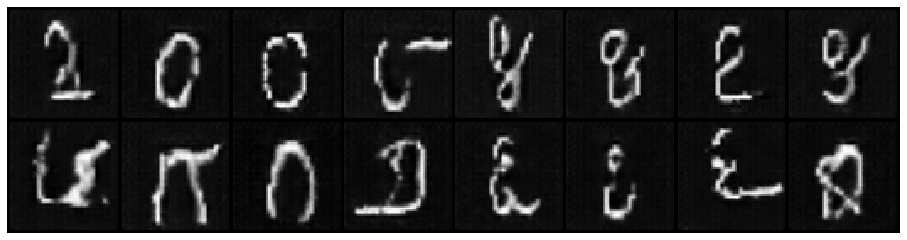

Epoch: [9/200], Batch Num: [200/600]
Discriminator Loss: 0.2285, Generator Loss: 3.1173
D(x): 0.9371, D(G(z)): 0.1257


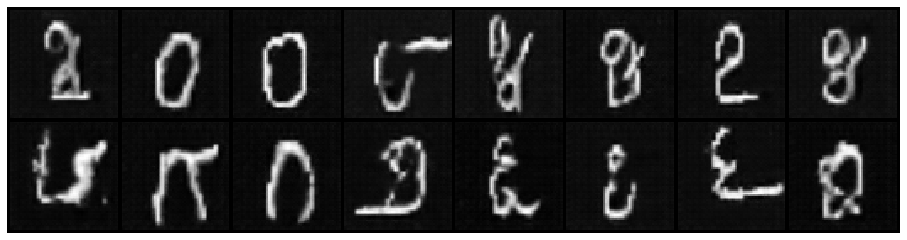

Epoch: [9/200], Batch Num: [300/600]
Discriminator Loss: 0.0924, Generator Loss: 3.6356
D(x): 0.9344, D(G(z)): 0.0193


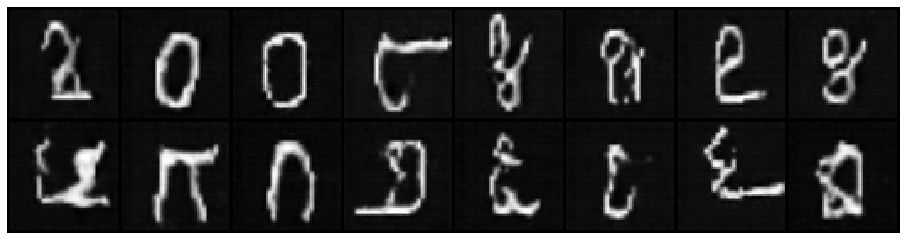

Epoch: [9/200], Batch Num: [400/600]
Discriminator Loss: 0.3161, Generator Loss: 3.1048
D(x): 0.9943, D(G(z)): 0.2223


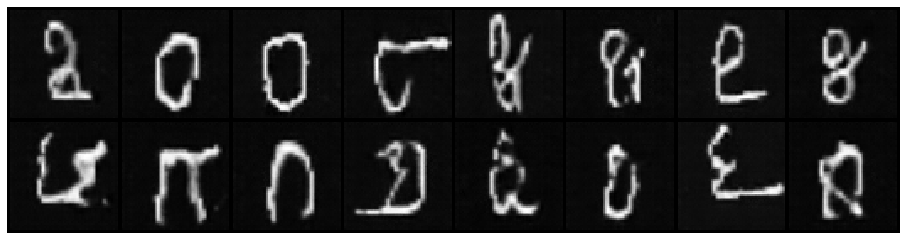

Epoch: [9/200], Batch Num: [500/600]
Discriminator Loss: 0.0984, Generator Loss: 5.1451
D(x): 0.9970, D(G(z)): 0.0851


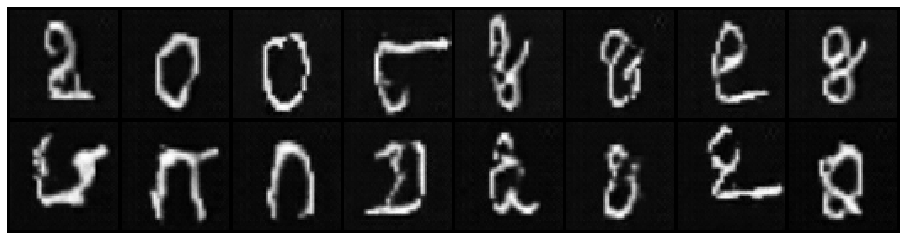

Epoch: [10/200], Batch Num: [0/600]
Discriminator Loss: 0.0286, Generator Loss: 5.7590
D(x): 0.9867, D(G(z)): 0.0147


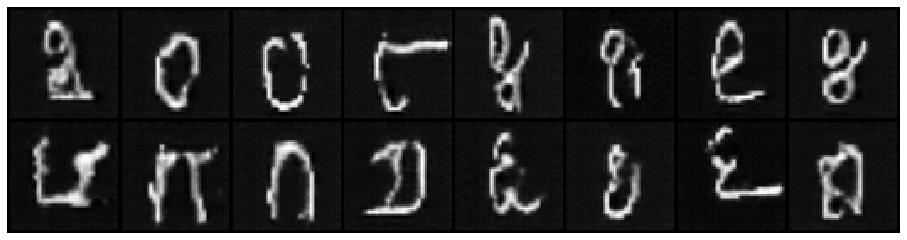

Epoch: [10/200], Batch Num: [100/600]
Discriminator Loss: 0.0670, Generator Loss: 4.5667
D(x): 0.9785, D(G(z)): 0.0408


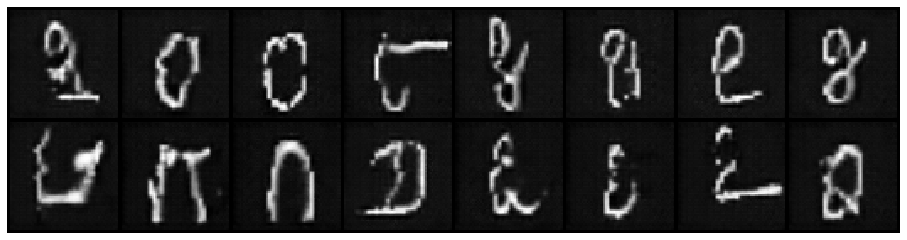

Epoch: [10/200], Batch Num: [200/600]
Discriminator Loss: 0.4001, Generator Loss: 3.6929
D(x): 0.7491, D(G(z)): 0.0221


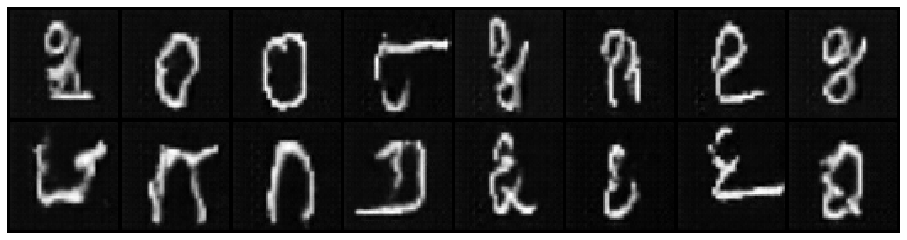

Epoch: [10/200], Batch Num: [300/600]
Discriminator Loss: 0.0510, Generator Loss: 5.9172
D(x): 0.9762, D(G(z)): 0.0235


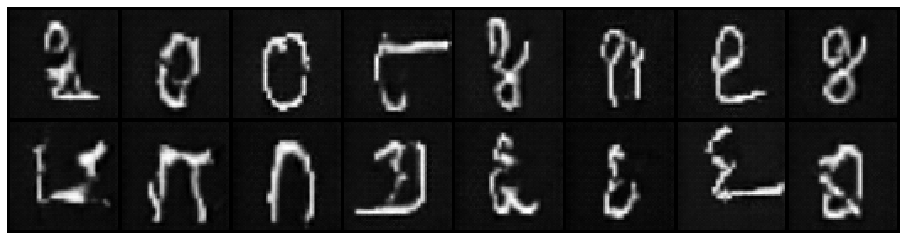

Epoch: [10/200], Batch Num: [400/600]
Discriminator Loss: 1.3393, Generator Loss: 7.4096
D(x): 0.9969, D(G(z)): 0.6421


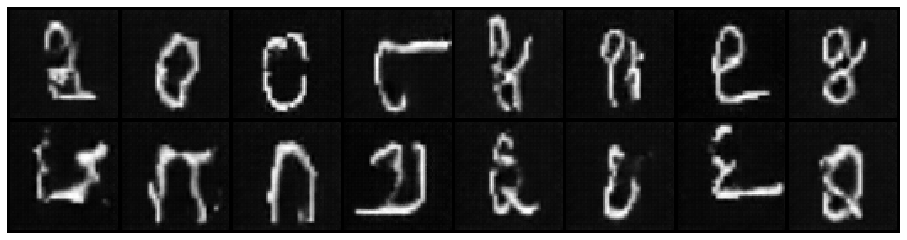

Epoch: [10/200], Batch Num: [500/600]
Discriminator Loss: 0.6478, Generator Loss: 5.4879
D(x): 0.9869, D(G(z)): 0.4102


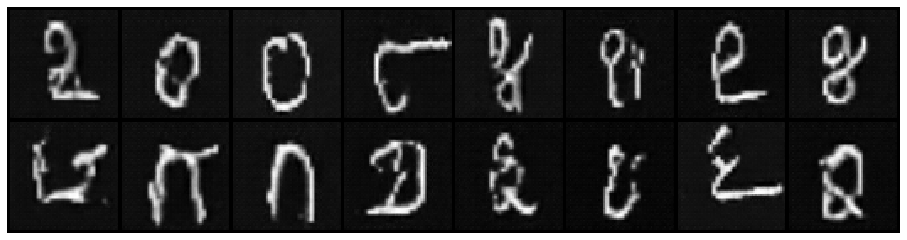

Epoch: [11/200], Batch Num: [0/600]
Discriminator Loss: 0.0374, Generator Loss: 4.5105
D(x): 0.9852, D(G(z)): 0.0215


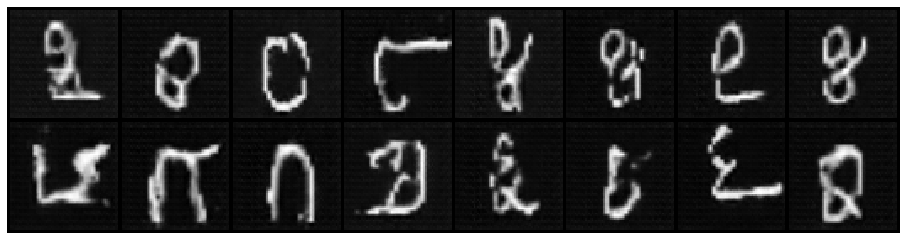

Epoch: [11/200], Batch Num: [100/600]
Discriminator Loss: 0.0566, Generator Loss: 3.8119
D(x): 0.9742, D(G(z)): 0.0286


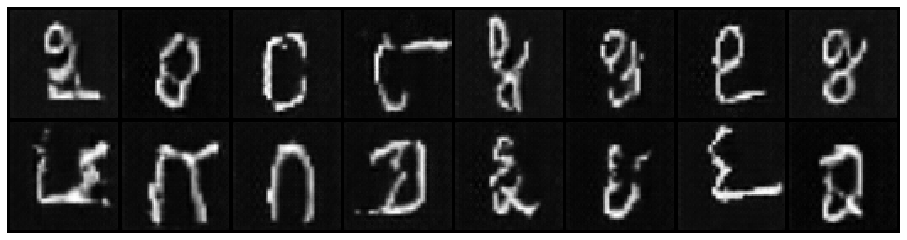

Epoch: [11/200], Batch Num: [200/600]
Discriminator Loss: 0.1061, Generator Loss: 2.9011
D(x): 0.9741, D(G(z)): 0.0718


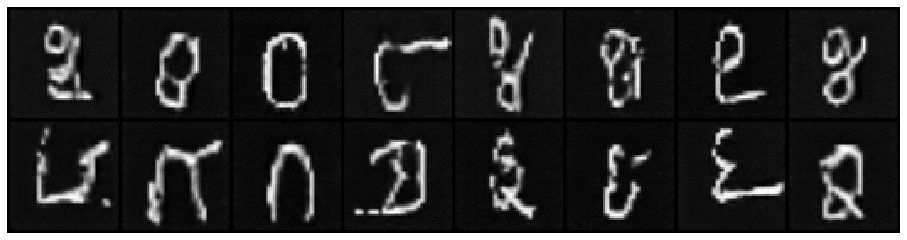

Epoch: [11/200], Batch Num: [300/600]
Discriminator Loss: 0.0264, Generator Loss: 5.4781
D(x): 0.9845, D(G(z)): 0.0103


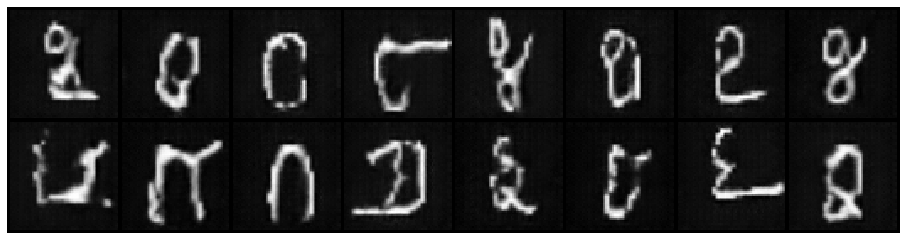

Epoch: [11/200], Batch Num: [400/600]
Discriminator Loss: 0.2855, Generator Loss: 3.1791
D(x): 0.7969, D(G(z)): 0.0113


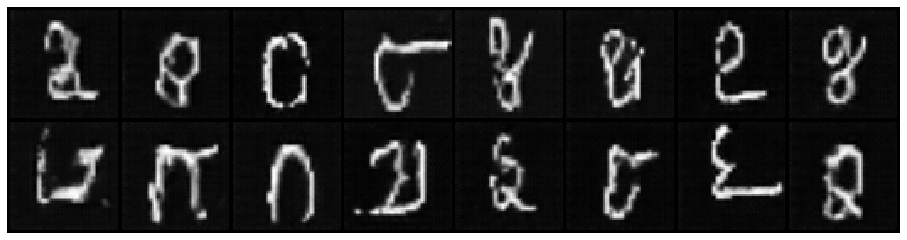

Epoch: [11/200], Batch Num: [500/600]
Discriminator Loss: 0.2416, Generator Loss: 4.4098
D(x): 0.9924, D(G(z)): 0.1819


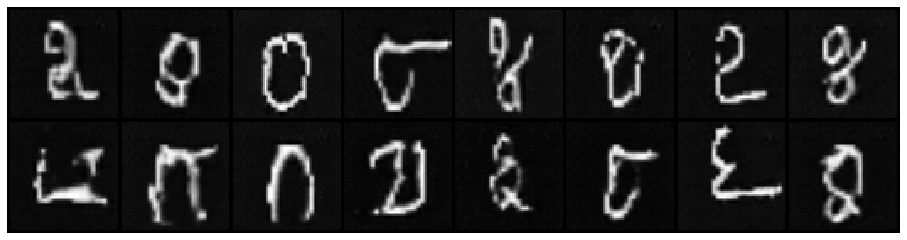

Epoch: [12/200], Batch Num: [0/600]
Discriminator Loss: 0.0305, Generator Loss: 5.7648
D(x): 0.9822, D(G(z)): 0.0120


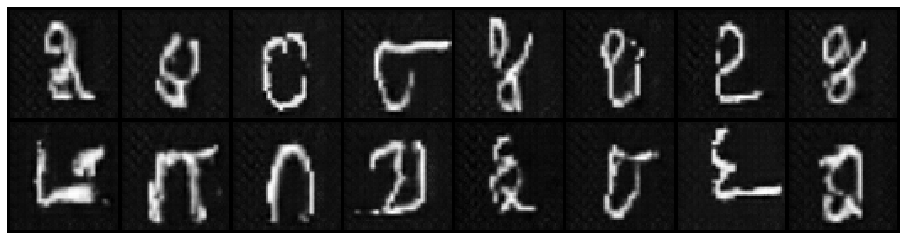

Epoch: [12/200], Batch Num: [100/600]
Discriminator Loss: 0.0460, Generator Loss: 3.7502
D(x): 0.9860, D(G(z)): 0.0306


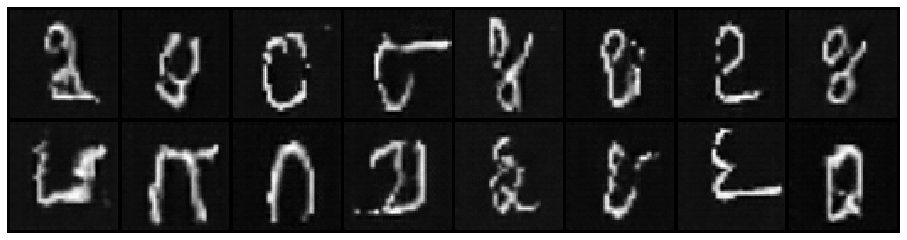

Epoch: [12/200], Batch Num: [200/600]
Discriminator Loss: 0.0826, Generator Loss: 3.2147
D(x): 0.9523, D(G(z)): 0.0292


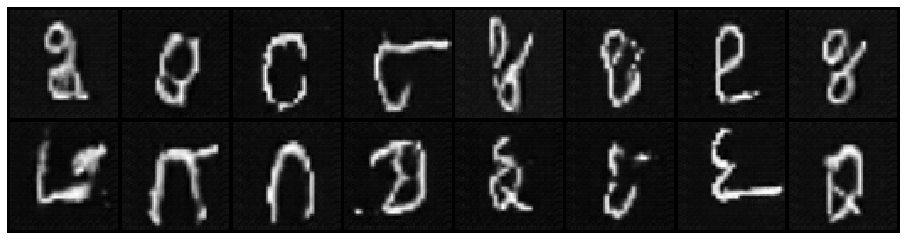

Epoch: [12/200], Batch Num: [300/600]
Discriminator Loss: 0.0501, Generator Loss: 5.7967
D(x): 0.9701, D(G(z)): 0.0174


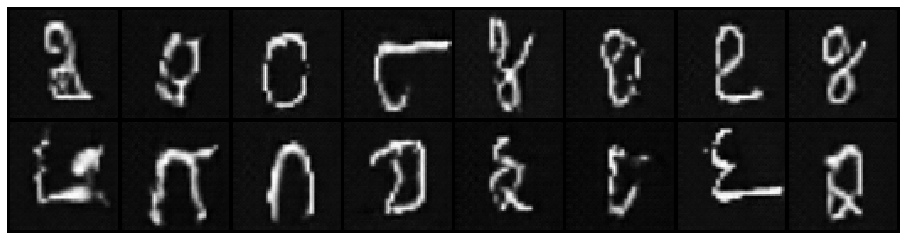

Epoch: [12/200], Batch Num: [400/600]
Discriminator Loss: 1.0132, Generator Loss: 0.8070
D(x): 0.5194, D(G(z)): 0.0509


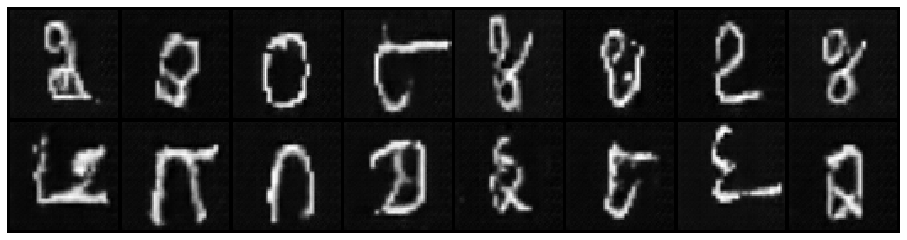

Epoch: [12/200], Batch Num: [500/600]
Discriminator Loss: 0.0817, Generator Loss: 4.1691
D(x): 0.9887, D(G(z)): 0.0602


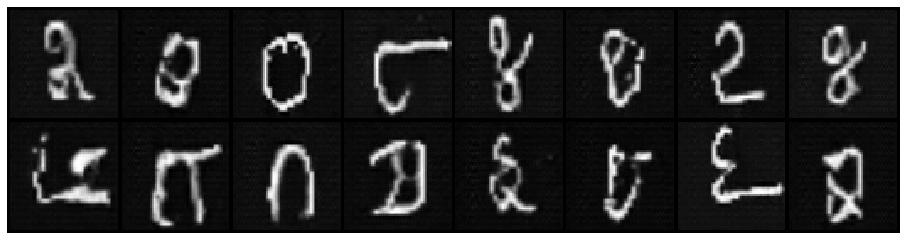

Epoch: [13/200], Batch Num: [0/600]
Discriminator Loss: 0.0243, Generator Loss: 5.2635
D(x): 0.9905, D(G(z)): 0.0141


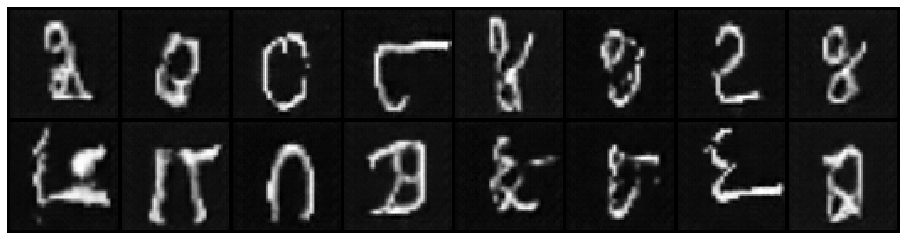

Epoch: [13/200], Batch Num: [100/600]
Discriminator Loss: 0.0547, Generator Loss: 5.1215
D(x): 0.9672, D(G(z)): 0.0194


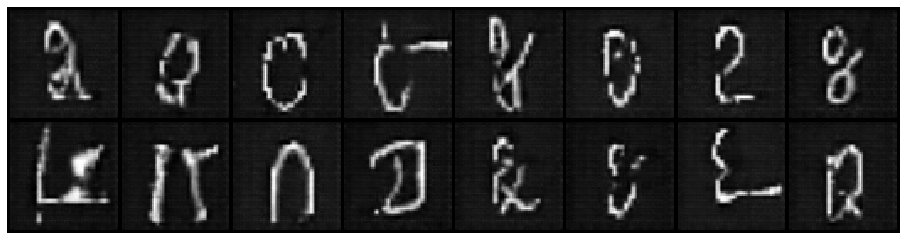

Epoch: [13/200], Batch Num: [200/600]
Discriminator Loss: 0.4681, Generator Loss: 3.9953
D(x): 0.8725, D(G(z)): 0.2100


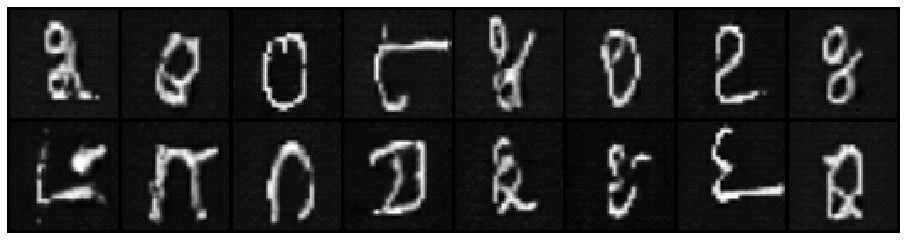

Epoch: [13/200], Batch Num: [300/600]
Discriminator Loss: 0.0500, Generator Loss: 4.3908
D(x): 0.9892, D(G(z)): 0.0365


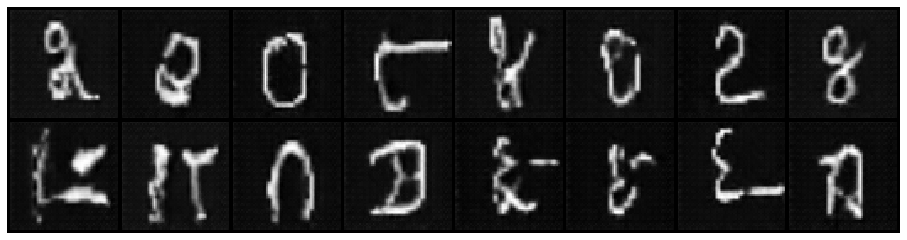

Epoch: [13/200], Batch Num: [400/600]
Discriminator Loss: 0.3474, Generator Loss: 4.8093
D(x): 0.7607, D(G(z)): 0.0157


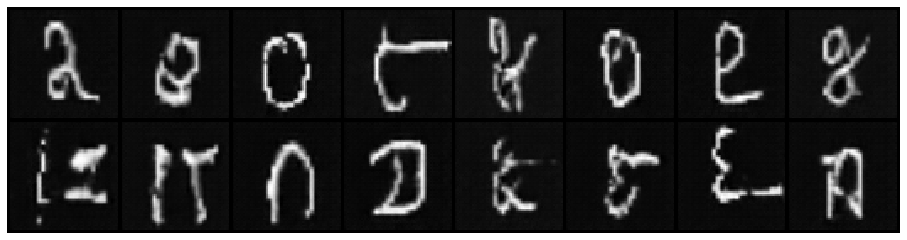

Epoch: [13/200], Batch Num: [500/600]
Discriminator Loss: 0.0294, Generator Loss: 5.0600
D(x): 0.9855, D(G(z)): 0.0141


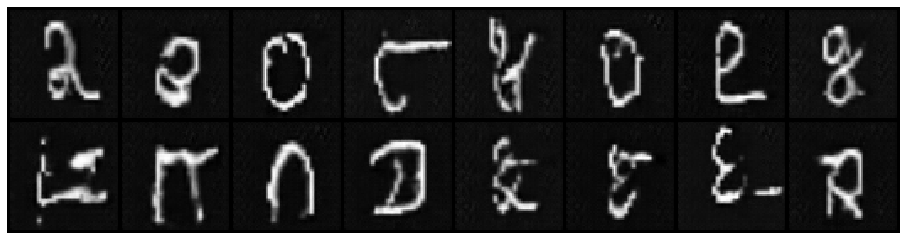

Epoch: [14/200], Batch Num: [0/600]
Discriminator Loss: 0.0206, Generator Loss: 5.8797
D(x): 0.9919, D(G(z)): 0.0120


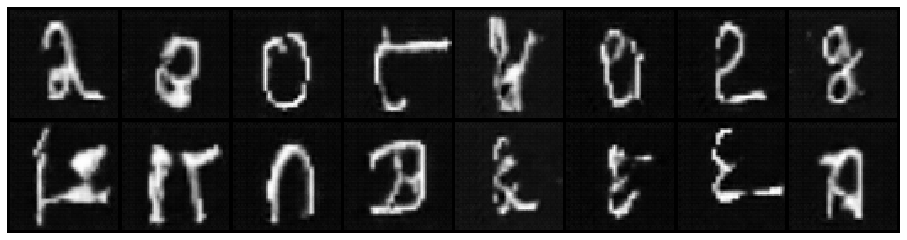

Epoch: [14/200], Batch Num: [100/600]
Discriminator Loss: 0.0545, Generator Loss: 5.0135
D(x): 0.9897, D(G(z)): 0.0410


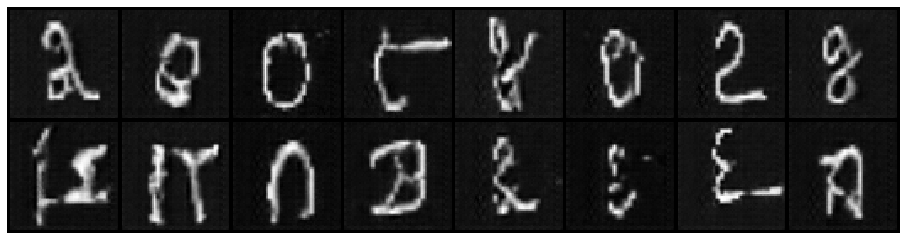

Epoch: [14/200], Batch Num: [200/600]
Discriminator Loss: 0.1573, Generator Loss: 3.9354
D(x): 0.9555, D(G(z)): 0.0903


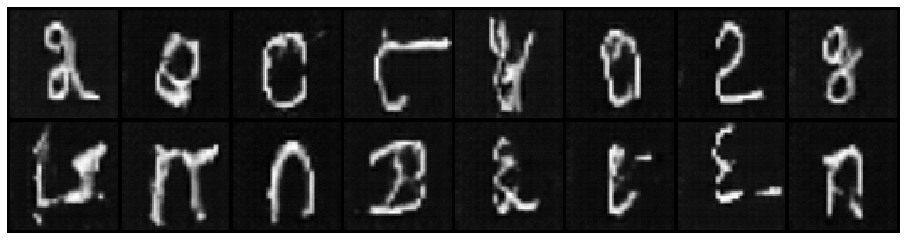

Epoch: [14/200], Batch Num: [300/600]
Discriminator Loss: 0.3317, Generator Loss: 2.8641
D(x): 0.9852, D(G(z)): 0.2039


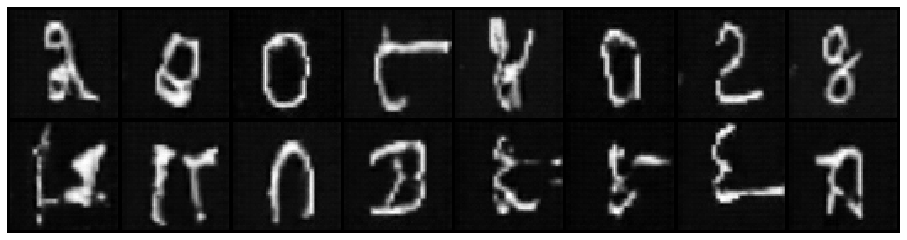

Epoch: [14/200], Batch Num: [400/600]
Discriminator Loss: 0.2755, Generator Loss: 3.9948
D(x): 0.7954, D(G(z)): 0.0228


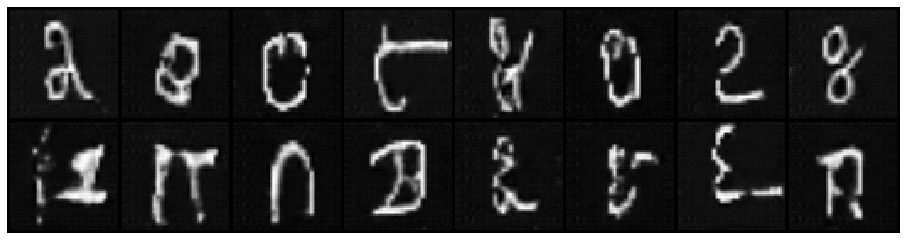

Epoch: [14/200], Batch Num: [500/600]
Discriminator Loss: 0.5741, Generator Loss: 4.1340
D(x): 0.9904, D(G(z)): 0.3582


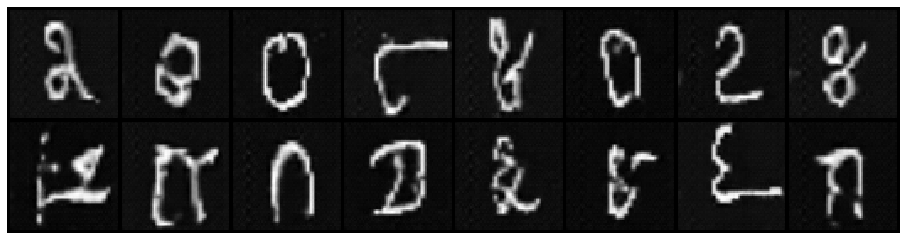

Epoch: [15/200], Batch Num: [0/600]
Discriminator Loss: 0.0485, Generator Loss: 4.9410
D(x): 0.9820, D(G(z)): 0.0287


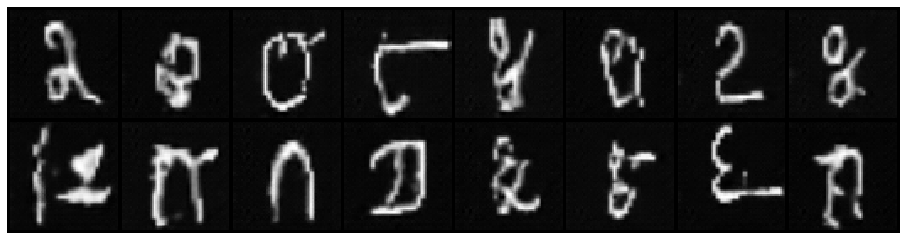

Epoch: [15/200], Batch Num: [100/600]
Discriminator Loss: 0.0155, Generator Loss: 5.8804
D(x): 0.9934, D(G(z)): 0.0087


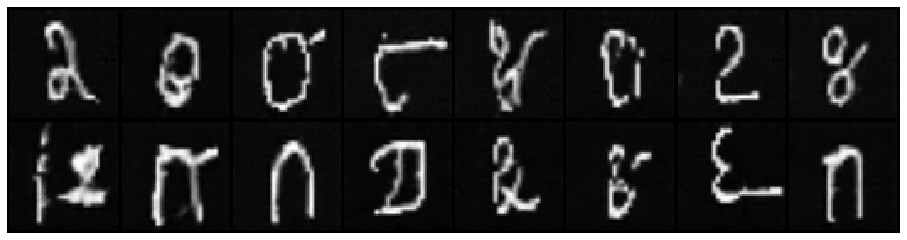

Epoch: [15/200], Batch Num: [200/600]
Discriminator Loss: 0.0117, Generator Loss: 6.2629
D(x): 0.9926, D(G(z)): 0.0039


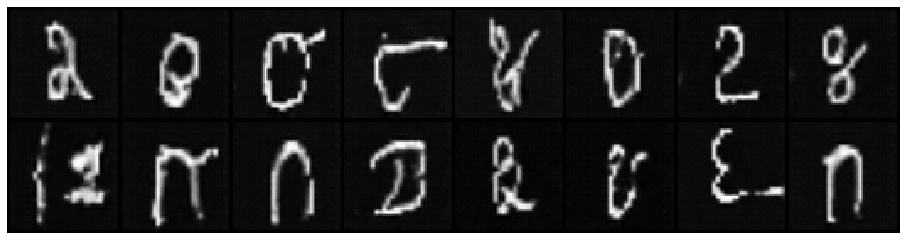

Epoch: [15/200], Batch Num: [300/600]
Discriminator Loss: 0.0110, Generator Loss: 6.7088
D(x): 0.9938, D(G(z)): 0.0046


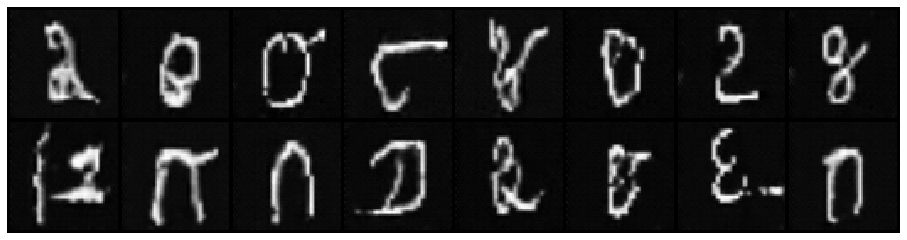

Epoch: [15/200], Batch Num: [400/600]
Discriminator Loss: 0.3295, Generator Loss: 0.2162
D(x): 0.7523, D(G(z)): 0.0007


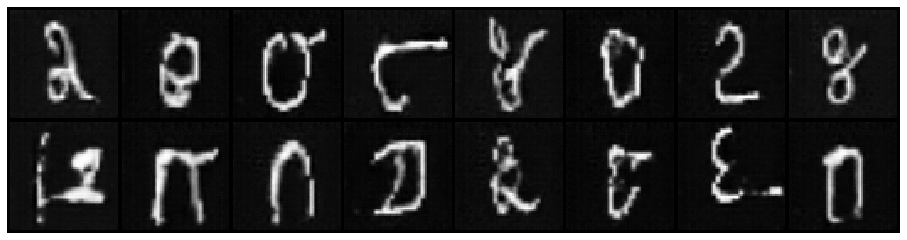

Epoch: [15/200], Batch Num: [500/600]
Discriminator Loss: 1.8940, Generator Loss: 7.8200
D(x): 0.9956, D(G(z)): 0.7300


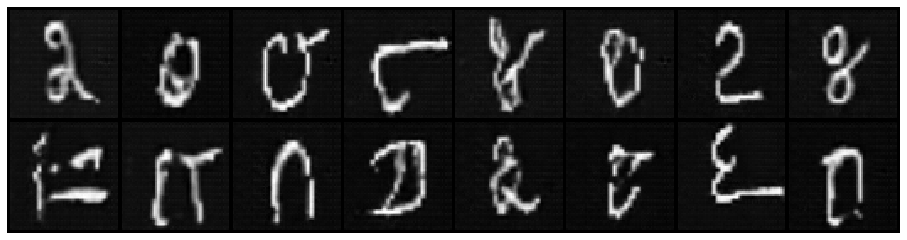

Epoch: [16/200], Batch Num: [0/600]
Discriminator Loss: 0.0697, Generator Loss: 3.8204
D(x): 0.9474, D(G(z)): 0.0124


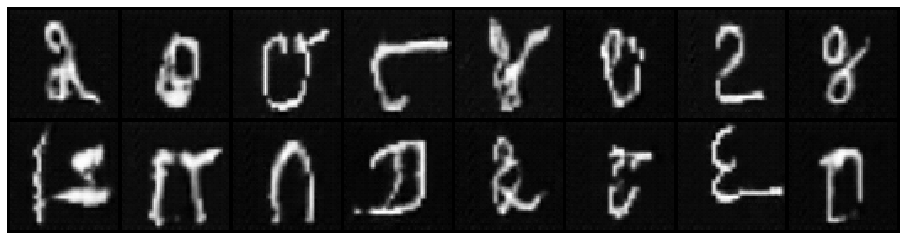

Epoch: [16/200], Batch Num: [100/600]
Discriminator Loss: 0.0151, Generator Loss: 3.5874
D(x): 0.9901, D(G(z)): 0.0050


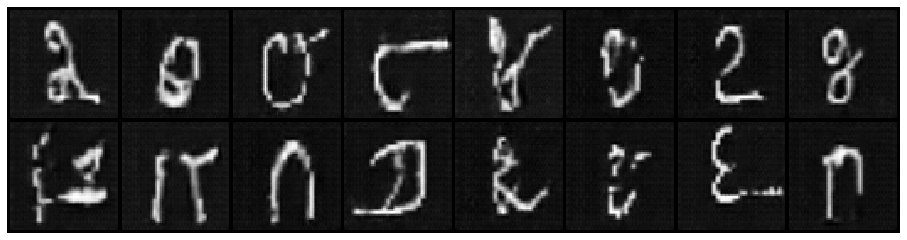

Epoch: [16/200], Batch Num: [200/600]
Discriminator Loss: 0.1536, Generator Loss: 3.9525
D(x): 0.9528, D(G(z)): 0.0856


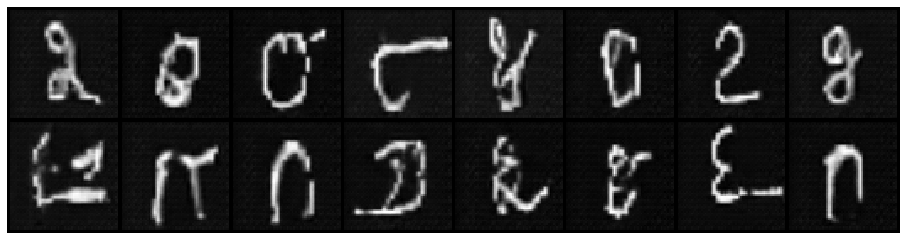

Epoch: [16/200], Batch Num: [300/600]
Discriminator Loss: 0.0534, Generator Loss: 4.1366
D(x): 0.9758, D(G(z)): 0.0264


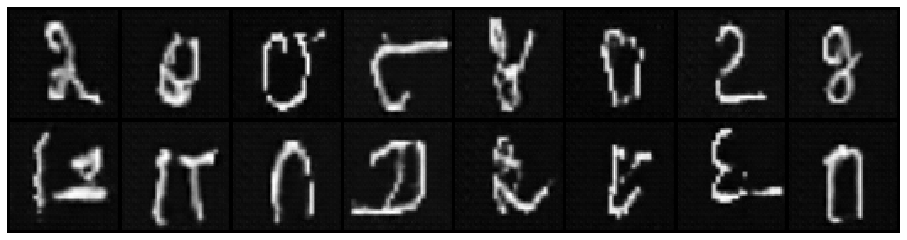

Epoch: [16/200], Batch Num: [400/600]
Discriminator Loss: 0.0663, Generator Loss: 4.6827
D(x): 0.9550, D(G(z)): 0.0168


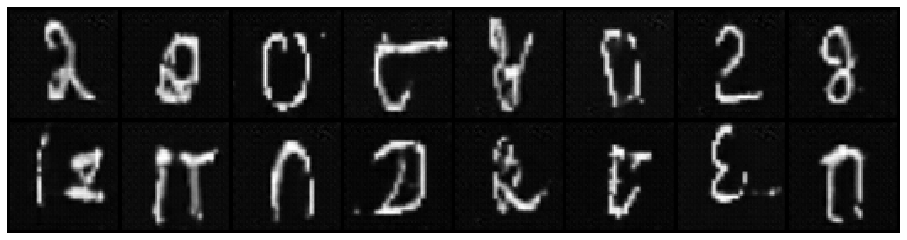

Epoch: [16/200], Batch Num: [500/600]
Discriminator Loss: 0.0172, Generator Loss: 5.7387
D(x): 0.9944, D(G(z)): 0.0113


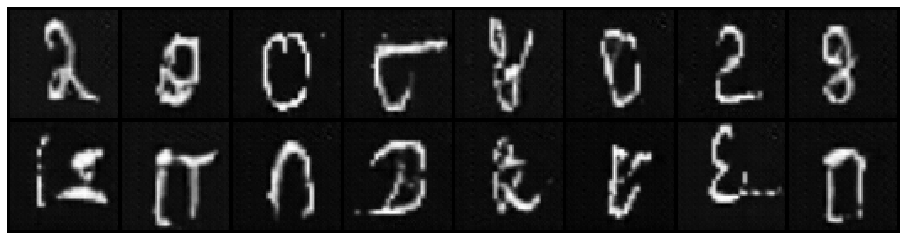

Epoch: [17/200], Batch Num: [0/600]
Discriminator Loss: 0.0146, Generator Loss: 6.0916
D(x): 0.9930, D(G(z)): 0.0073


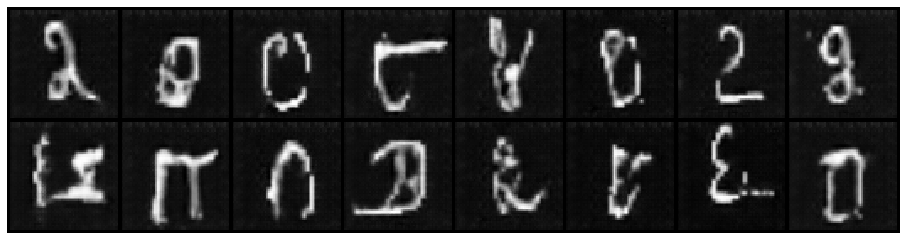

Epoch: [17/200], Batch Num: [100/600]
Discriminator Loss: 0.0788, Generator Loss: 4.2656
D(x): 0.9584, D(G(z)): 0.0324


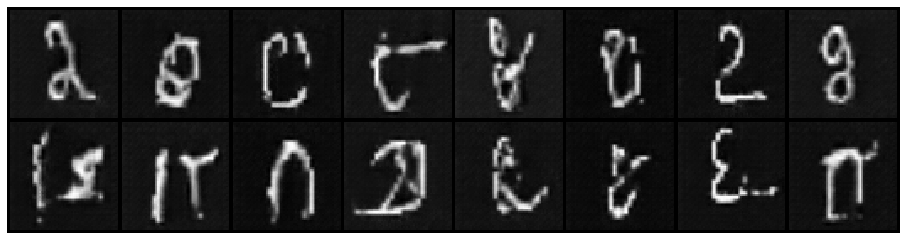

Epoch: [17/200], Batch Num: [200/600]
Discriminator Loss: 0.0857, Generator Loss: 5.3059
D(x): 0.9726, D(G(z)): 0.0519


In [0]:
logger = Logger(model_name='DCGAN', data_name='MNIST')
nn_output = []

for epoch in range(num_epochs):
    d_loss, g_loss = 0, 0
    cnt = 0
    for n_batch, (real_batch) in enumerate(data_loader):
        
        # 1. Train Discriminator
        real_data = Variable(real_batch)
        if torch.cuda.is_available(): real_data = real_data.cuda()
        # Generate fake data
        fake_data = generator(noise(real_data.size(0))).detach()
        # Train D
        d_error, d_pred_real, d_pred_fake = train_discriminator(d_optimizer, 
                                                                real_data, fake_data)

        # 2. Train Generator
        # Generate fake data
        fake_data = generator(noise(real_batch.size(0)))
        # Train G
        g_error = train_generator(g_optimizer, fake_data)
        # Log error
        logger.log(d_error, g_error, epoch, n_batch, num_batches)
        
        # Display Progress
        if (n_batch) % 100 == 0:
            # display.clear_output(True)
            # Display Images
            test_images = generator(test_noise).data.cpu()
            logger.log_images(test_images, num_test_samples, epoch, n_batch, num_batches);
            # Display status Logs
            (epoch, temp_d_loss, temp_g_loss) = logger.display_status(
                                          epoch, num_epochs, n_batch, num_batches,
                                          d_error, g_error, d_pred_real, d_pred_fake
                                      )
            d_loss += temp_d_loss
            g_loss += temp_g_loss
            cnt += 1
    
        # Model Checkpoints
        logger.save_models(generator, discriminator, epoch)

    d_loss, g_loss = d_loss/cnt, g_loss/cnt
    nn_output.append([epoch, d_loss, g_loss])

In [0]:
pd_results = pd.DataFrame(nn_output, columns = ['epoch','d_loss','g_loss'])
display(pd_results)

In [0]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(12, 4))
axes.plot(pd_results['epoch'],pd_results['d_loss'], label='discriminative loss')
axes.plot(pd_results['epoch'],pd_results['g_loss'], label='generative loss')
# axes[0].plot(pd_results['epoch'],pd_results['test_loss'], label='test_loss')

axes.legend()

# axes[1].plot(pd_results['epoch'],pd_results['valid_acc'], label='validation_acc')
# axes[1].plot(pd_results['epoch'],pd_results['train_acc'], label='train_acc')
# # axes[1].plot(pd_results['epoch'],pd_results['test_acc'], label='test_acc')
# axes[1].legend()